# Updated Sprint Notebook


**TLDR**

If we take the SVD of the weight matrices of:

- the OV circuit and 
- of MLP layers

and project them to token embedding space, we notice that they form highly semantically interpretable clusters. This means that the network learns to make sure that the larger 'actions' of each MLP weight matrix or attention head tend to write to semantically identifiable clusters of the residual stream. 

We can use this to both improve our understanding of transformer language models and edit their representations. We use this finding to design both a natural language query locator, where you can write a set of natural language concepts and find all weight directions in the network which correspond to it, and also to edit the network's representations by deleting specific singular vectors, which results in relatively large effects on the logits related to the semantics of that vector and relatively small effects on semantically different clusters


# Introduction

Trying to understand the internal representations of language models, and of deep neural networks in general, has been the primary focus of the field of mechanistic interpretability, with clear applications to AI alignment. If we can understand the internal dimensions along which language models store and manipulate representations, then we can get a much better grasp on their behaviour and ultimately may be able to both make provable statements about bounds on their behaviour, as well as make precise edits to the network to prevent or enhance desired behaviours.

Interpretability, however, is quite a field where we still do not yet fully understand what the basic units of the networks' representations are. While analyzing and investigating individual neurons has lead to some impressive results, especially in [convolutional vision models](https://distill.pub/2020/circuits/), a key issue has always been the polysemanticity of neurons. A single neuron might not just represent a single 'feature' but some linear combination of features in superposition. This effect has been studied in [toy models](https://transformer-circuits.pub/2022/toy_model/index.html) where it is argued that neural networks resort to superpsition when required to represent many more features than they have neurons, and that superposition has a regular and understandable geometry.

A natural hypothesis following from the apparent ubiquity of superposition in neural networks, as well as the autoassociative memory literature, is to store features *as directions* and not in individual neurons. To minimize interference ideally these directions would be pseudo-orthogonal. Technically the features as neurons hypothesis is trivially an orthogonal direction where each feature is encoded by a specific neuron, but the storage capacity of this representational scheme  scales only linearly. In theory, we can do much better if we instead distribute features across multiple neurons and accept some noise. Specifically, the [Johnson-Lindenstrauss lemma](https://en.wikipedia.org/wiki/Johnson–Lindenstrauss_lemma) suggests that we can store *exponentially* many features in pseudorthogonal subspaces. While neural networks probably cannot utilize all of this exponential space, they almost certainly scale superlinearly, necessitating polysemanticity across 'neurons'. 

If this hypothesis is true, at least approximately, a key question becomes how we can figure out the directions in which specific features are encoded. While certainly not the entire story, we hypothesize that at least a number of the primary directions used by the network can be inferred from the SVD decomposition of its weight matrices. This makes sense since the network's weights are ultimately linear maps that act upon its representations, and the largest singular vectors of the weight matrix are precisely the directions in which the weight matrix has the largest action. In this post, we show that these SVD directions are often highly and robustly interpretable in medium-sized transformer language models, a property we expect to apply more generally to any transformer or residual architecture.

Specifically, we demonstrate that the SVD directions of both the MLP input and output weights as well as the OV circuit in the transformer, when projected to token space, yield highly interpretable clusters for most of the singular directions. Secondly, we show that this can be applied to automatically detect weight matrices and directions in weight space that match closely with a given set of tokens, and can be used to directly edit model weights to remove or enhance specific singular directions, with strong differential effects on the output logits corresponding to those semantic directions. 

Additionally, we experiment with automatic labelling of the SVD directions and find that by using GPT3 as a labeller, we can get reasonable interpretations of directions which allows us to perform comprehensive sweeps of all singular directions in the MLPs over the GPT2 model class, thus providing a proof of concept of scalable automatic labelling on a real task.


# Transformer Architecture


*This is a rather quick and idiosyncratic overview of the elements of transformer networks relevant to this post. For a great general tutorial on how transformers work please see [this post](https://jalammar.github.io/illustrated-transformer/). Here we only discuss autoregressive sequence to sequence models typified by the GPT models. We run our experiments primarily on the gpt2 series of models released by OpenAI.*

Transformers learn from token sequences to token sequences. They are trained with an autoregressive objective so that they predict the next element of the sequence from the sequence prefix.

The core of the transformer model is the residual stream so that tokens can pass through theoretically modified all the way to the end of the network. At the end, at block $L$, the embedding representation is decoded using the transpose of the embedding matrix $\hat{t}_i = x_L(i) E^T$. This means that the embedding matrix must be approximately orthogonal.

At each block information is added to the residual stream through the application of attention and MLP blocks. A single 'block' consists of both an attention and an MLP layer. These blocks read in the residual stream representation, perform some computation on it, and write out an output back into the residual stream. Mathematically, this results in,


* **$\hat{x}_l  = x_{l-1} + attn(ln(x_{l-1}))$**

* **$x_l = \hat{x}_l + mlp(ln(\hat{x}_l))$**


Where $attn(x) = W_O V \sigma(QK^T)$ with query, key and value matrices defined as usual $V = W_V x$,$Q = W_Qx$, $K= W_K x$. $ln(x)$ is the layer-norm operation. $\sigma(x)$ is the softmax function. 

We use insight of the [Elhage et al 2022](https://transformer-circuits.pub/2021/framework/index.html) which is that we can interpret the query and key matrices and value and output matrices not as individual matrices but as single bilinear matrices $QK$ and $OV$ since they only implement linear maps. We call these the $QK$ and $OV$ circuits following their terminology. We are especially interested in the $OV$ circuit $OV \in \mathcal{R}^{{d_e}, {d_e}}$ which we will find to be highly interpretable. The $OV$ matrix writes linearly into the residual stream and does not mix information between tokens while the $QK$ attention circuit mixes information between tokens and is gated by the softmax nonlinearity.

The MLP layers in the transformer are simple 2 layer MLPs $mlp(x) = W_{\text{out}} f(W_{\text{in}}x)$ where $f$ is a standard activation function such as gelu. The $W_{\text{out}}$ matrix writes directly and linearly into the residual stream. The $W_{\text{in}}$ matrix reads linearly from the residual stream if you ignore the layernorm operation. The hidden layer of the MLP typically expands the dimensionality of the residual stream by a factor (which is usually 4) $d_h = 4 \times d_e$ such that  $W_{\text{in}} \in \mathcal{R}^{{d_h} \times {d_e}}$ and $W_{\text{out}} \in \mathcal{R}^{{d_e} \times {d_h}}$.

A transformer model consists of a large number of blocks stacked up sequentially. For instance, gpt2-medium (an approximately 300M parameter model) consists of 24 blocks. 

A key insight first written about by Nostalgebraist in the [logit lens](https://www.lesswrong.com/posts/AcKRB8wDpdaN6v6ru/interpreting-gpt-the-logit-lens) is that the dimensionality of the representation is maintained exactly throughout the residual stream, and because of this we can *apply the  de-embedding matrix* $E^T$ to the residual stream *at any point during processing* to get a sense of what the model would output if forced to stop processing at that point. This gives a sense of the way in which information is processed by the model. For instance, you can find out the block at which the model first recognizes the 'correct' answer to a question by projecting the activations of the residual stream at each block to token space and tracking the log-probability of the correct answer token.

A related insight recently proposed in [this paper](https://arxiv.org/pdf/2209.02535) is that many of the weight matrices are of the same dimensionality as the residual stream and hence can also be projected to token space by applying the embedding matrix. For instance, the dimensionality of $W_{\text{out}}$ of the embedding is of dimension $\mathcal{R}^{{d_e} \times {d_h}}$. This means that each of the $d_h$ columns of $W_{\text{out}}$ is of dimension $\mathcal{R}^{d_e}$ which is the same dimension as the embedding and so we can multiply it by the de-embedding matrix $E^T$ to obtain its projection into token space. Intuitively, what this means is that for each neuron in the MLP hidden layer, we can understand how its output weight matrix tends to write back into the residual stream in terms of the tokens it primarily interacts with. They show that in some cases you can get semantic and interpretable clusters of tokens upweighted for each neuron.

However, if you play with [their code](https://github.com/guyd1995/embedding-space) you can quickly realize that their headline results are quite cherrypicked. Most neurons do not appear to encode semantically relevant dimensions in their weights, but instead appear highly polysemantic. Again, this suggests that *neurons* are not the right units of analysis.

Instead, we think and provide evidence that *directions* are a much better unit of analysis. Specifically, if instead of analyzing specific neurons -- i.e. rows of the weight matrix, we perform the same analysis on the *principal directions of action* of the weight matrix, we obtain extremely interpretable results with high reliability and without cherrypicking. We find approximately (70%) (-/?) of the top 50 singular vectors are highly interpretable for the later blocks of the network.

To find these *principal axes of action* of the matrix, we first perform a singular value decomposition of the weight matrix, and then study the singular vectors with the top-k highest singular values. Intuitively, this makes sense because the largest singular vectors encode the directions in which the action of the matrix makes the largest change to the norm of its inputs. To understand intuitively how this works, we first need to understand the singular value decomposition (SVD).







# The Singular Value Decomposition SVD

The SVD is a well known matrix decomposition which factors a matrix into three components -- matrices of left and right singular vectors, which are orthogonal, and a diagonal matrix of singular values. It can be thought of as the generalization of the eigenvalue decomposition to non-square matrices.

Mathematically, the SVD can be represented as,

$M = U S V$

Where $M$ is a $H \times W$ rectangular matrix and $U$ is a $H \times H$ orthogonal matrix, $V$ is a $W \times W$ orthogonal matrix and $S$ is a $H \times W$ diagonal matrix. We each each row of $U$ the right singular vectors and each column of $V$ the left singular vectors.

Intuitively, we can imagine the SVD as rotating the original basis to a new orthogonal basis, where the i'th singular vector quantifies the direction which has the i'th largest effect on the Frobenius norm of a random vector -- i.e. the directions which the matrix expands the most. Another way to think of the SVD is that any linear transformation (encoded in a matrix) can be thought of as comprising a rotation, a rescaling, and a second rotation 'back' into the original basis. $U$ and $V$ can be interpreted as orthogonal rotation matrices corresponding to these rotations and the singular values $S$ can be interpreted as parametrizing this scaling. A final, helpful, intuition about the SVD is as the optimal linear compressor of a matrix with each singular vector corresponding to the 'components' of the matrix and the singular value to the importance of the component. It thus allows us to construct the optimal (linear) low rank approximation of a matrix by ablating the lowest singular values first.

For further intuition on how SVD works we recommend [this post](https://gregorygundersen.com/blog/2018/12/10/svd/).

# Our SVD projection method

Our method is extremely simple. Take a weight matrix $M$ of the network. Take the SVD of this matrix to obtain left and right singular vectors $M = USV$. Take whichever matrix has the same dimensionality as the residual stream (typically the right singular matrix $V$). Take the i'th component of $V$ which corresponds to the i'th singular vector $V[i,:]$ Use the de-embedding matrix $E^T$ to project the i'th singular vector to token space $\hat{t}_i = V[i,:] E^T$. Take the top-k tokens and see that they often correspond to highly semantically interpretable clusters, which imply that this singular vector primarily acts on a semantic subspace.

# Initial Setup Code

Here we just initialize our model and setup a lot of utility functions which will be used later on. We work primarily with gpt2-medium but can straightforwardly apply our analysis to other models. In our quantitative automated labelling we perform a systematic sweep over other GPT2 models.

GPT2-medium is an autoregressive decoder only transformer. It has 24 blocks consisting of an attention and MLP layer. The attention layers have 16 heads. It has a residual dimension of 1024 dimensions and a typical sequence length also of 1024 tokens. The MLP hidden width is $4 \times 1024 = 4096$.

## Setup

In [1]:
%pip install transformers
%pip install datasets
%pip install tabulate

Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.


In [2]:
import torch
from collections import Counter
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import gc
from copy import deepcopy
from tqdm.auto import tqdm, trange
import re
from collections import defaultdict
from transformers import AutoModelForCausalLM, AutoTokenizer
# utils
import json
from torch import nn
import torch.nn.functional as F
from datasets import load_dataset
from copy import deepcopy
from torch.nn import functional as F
from tqdm import tqdm, trange
import functools
import math

# this resets up the site so you don't have to restart the runtime to use pysvelte
import site
site.main()

import tabulate
sns.set_palette('colorblind')
cmap = sns.color_palette('colorblind')

In [3]:
import transformer_lens
import transformer_lens.utils as utils
from transformer_lens.hook_points import HookPoint
from transformer_lens import utils, HookedTransformer, HookedTransformerConfig, FactoredMatrix, ActivationCache

from fancy_einsum import einsum
# %pip install git+https://github.com/callummcdougall/CircuitsVis.git#subdirectory=python
import circuitsvis as cv
torch.set_grad_enabled(False)
import plotly.graph_objects as go
import plotly.express as px
from IPython.display import display, HTML

# NO TRAINING IN THIS NOTEBOOK
torch.set_grad_enabled(False);

## Utility functions

In [4]:
# NOTE: torch.nn.functional.cosine_similarity() has shape requirements 
def cosine_sim(x,y):
    return torch.dot(x,y) / (torch.norm(x) * torch.norm(y))

---

# GPT2-Medium

Switching to GPT2-medium to try and replicate their results

## Loading model

In [5]:
device = "cuda" if torch.cuda.is_available() else "cpu"
model = HookedTransformer.from_pretrained("gpt2-medium", 
                                          fold_ln=False, 
                                          center_writing_weights=False, 
                                          center_unembed=False,
                                          device=device)

Using pad_token, but it is not set yet.


Loaded pretrained model gpt2-medium into HookedTransformer


**NOTE**: The demo in transformer lens uses:
`fold_ln=False, center_writing_weights=False, center_unembed=False`

In [6]:
n_layers, n_heads = model.cfg.n_layers, model.cfg.n_heads
d_model, d_head =  model.cfg.d_model, model.cfg.d_head
all_tokens = [model.tokenizer.decode([i]) for i in range(model.tokenizer.vocab_size)]

Note the differences in size from above:

In [7]:
f'{d_model=}, {n_layers=}, {n_heads=}, {d_head=}'

'd_model=1024, n_layers=24, n_heads=16, d_head=64'

In [8]:
model.W_E.shape, model.W_U.shape, model.OV.shape

(torch.Size([50257, 1024]),
 torch.Size([1024, 50257]),
 torch.Size([24, 16, 1024, 1024]))

## Take SVD

Make sure you've read above about being careful of the kind of SVD you take! 

In [9]:
U,S,V = model.OV.svd()
V_T = V.mT
model.OV.shape, U.shape, S.shape, V_T.shape 

(torch.Size([24, 16, 1024, 1024]),
 torch.Size([24, 16, 1024, 64]),
 torch.Size([24, 16, 64]),
 torch.Size([24, 16, 64, 1024]))

In [10]:
# %%time
# U,S,V_T = torch.linalg.svd(model.OV.AB, full_matrices=False)
# U.shape, S.shape, V_T.shape 

**Note**: This takes ~2 minutes: 
```
CPU times: user 1min 20s, sys: 0 ns, total: 1min 20s
Wall time: 1min 20s
```

These are of size `n_layers, n_heads, d_head, d_model`

## Calculate Singular Vector Activations

Here, we will calculate the singular vector activations - that is, we will project each SV into "token space", and then calculate their topk(20) tokens and plot them.

**NOTE**: We are using **different** unembedding matrices for the left and right singular values, as per a conversation with Stefan.

Briefly, rational is:
- the left singular vectors that read from the residual stream have never seen the unembedding matrix, but they have seen the embedding matrix, so we take the pseudoinverse (using an SVD). See [the wikipedia page](https://en.wikipedia.org/wiki/Moore%E2%80%93Penrose_inverse#Singular_value_decomposition_(SVD))
- the right SV that write to the residual stream have seen the unembedding matrix (later, we keep `W_U` and invert it to bring tokens back down for comparison) 

In [11]:
V_T.shape, V_T.mT.shape

(torch.Size([24, 16, 64, 1024]), torch.Size([24, 16, 1024, 64]))

In [12]:
# When using the full SVD:
# right_sv_ac = (V_T[:,:,:64,:]@ model.W_U).mT
right_sv_ac = (V_T@ model.W_U).mT
right_sv_ac.shape

torch.Size([24, 16, 50257, 64])

In [13]:
U.shape, torch.linalg.pinv(model.W_E).shape

(torch.Size([24, 16, 1024, 64]), torch.Size([1024, 50257]))

In [14]:
# When using the full SVD:
# left_sv_ac = (U[:,:,:,:64].mT @ torch.linalg.pinv(model.W_E)).mT
left_sv_ac = (U.mT @ torch.linalg.pinv(model.W_E)).mT
left_sv_ac.shape

torch.Size([24, 16, 50257, 64])

In [15]:
# ### NOTE: This was the OLD WAY for reference
# N_singular_vectors = 10
# U_activations = []
# V_activations = []
# for i in range(N_singular_vectors):
#     U_acts = U[...,:,i] @ torch.linalg.pinv(model.W_E)
#     V_acts = V_T[...,i,:] @ model.W_U      # rows of V_T are right sv
#     U_activations.append(U_acts)
#     V_activations.append(V_acts)

# U_activations = torch.stack(U_activations,dim=-1)
# V_activations = torch.stack(V_activations,dim=-1)
# print(U_activations.shape, V_activations.shape)
# torch.testing.assert_close(U_activations, left_sv[:,:,:,:10])
# torch.testing.assert_close(V_activations, right_sv[:,:,:,:10])

## Visualize Right Singular Vectors

In [16]:
# NOTE the strange size for circuitviz
layer = 22

tmp_ac = right_sv_ac[None,layer,...].cpu().numpy()
display(HTML(f'<div style="text-align: center;"><h3>Right SV - Layer:{layer}</h3></div>'))
cv.topk_tokens.topk_tokens(
    tokens=[all_tokens], 
    activations=tmp_ac,
    first_dimension_name='Attn. Head',
    third_dimension_name='Singular Vectors',
    max_k=20)

Lets confirm this is what we expect:

In [17]:
_,ipos = right_sv_ac[22,10,:,1].topk(k=20)
_,ineg = (-right_sv_ac[22,10,:,1]).topk(k=20)
model.tokenizer.decode(ipos), model.tokenizer.decode(ineg)

(' hear listeners hearsheard listener Hear hearing Hearing listened listen sonic auditoryInterstitial audibleSounds Heard heard Sound Listen listens',
 ' write writing writes written letters letter wrotewritewritten Writingwritwriting LetterWriting WriteWrite WritWritLetter Letters')

### Check 0-th Singular Vector:

They report:

> It is very common that the first singular vector does not encode anything meaningful and **simply encodes a component in the direction of the most frequent words**, as in this example (block 22, head 10) and layer 22 head 15:

In [18]:
_,ipos = right_sv_ac[22,10,:,0].topk(k=20)
_,ineg = (-right_sv_ac[22,10,:,0]).topk(k=20)
print("P:", '|'.join(model.to_str_tokens(ipos)))
print("N:", '|'.join(model.to_str_tokens(ineg)))

P:  the|-|,| and| a| "| in|
|.| (| to| The| of| is| for| on|:| '| I| that
N: inventoryQuantity|ÃÂÃÂ|ÃÂÃÂÃÂÃÂ|rawdownload||�|oreAnd|ÃÂÃÂÃÂÃÂÃÂÃÂÃÂÃÂÃÂÃÂÃÂÃÂÃÂÃÂÃÂÃÂ|||||�|�||||reportprint|�| サーティ


In [19]:
_,ipos = right_sv_ac[22,15,:,0].topk(k=20)
_,ineg = (-right_sv_ac[22,15,:,0]).topk(k=20)
print("P:", '|'.join(model.to_str_tokens(ipos)))
print("N:", '|'.join(model.to_str_tokens(ineg)))

P:  the|-|,| a| and|.| "|
| (| in| to| A| The| of|:| on| that| is| I| for
N: ゼウス|ÃÂÃÂ|GoldMagikarp| practition|ÃÂÃÂÃÂÃÂ| pione|ÃÂÃÂÃÂÃÂÃÂÃÂÃÂÃÂÃÂÃÂÃÂÃÂÃÂÃÂÃÂÃÂ|�||||��士||rawdownload|�||| RandomRedditor|inventoryQuantity|


Lets check all zero-th singular vectors for the last 5 layers:

In [20]:
for layer in range(n_layers-5,n_layers):
    for head in range(n_heads):
        _,ipos = right_sv_ac[layer,head,:,0].topk(k=20)
        _,ineg = (-right_sv_ac[layer,head,:,0]).topk(k=20)
        print(f'=========L{layer}H{head}=========')
        print("P:", model.tokenizer.decode(ipos)) 
        print("N:", model.tokenizer.decode(ineg))
        print()

=========L19H0=========
P:  ship sailing sea ocean submar maritime sailor boat sailors Sea ships seaf submarine sail marine underwater seas naval yacht Ship
N: ��極 "$:/ Kinnikuman�� Archdemonの魔 TsukuyomiGoldMagikarpocrin��士arnaevcloneembedreportprintoreAndÃÂÃÂÃÂÃÂgdalaOrderable GOODMAN ILCS TAMADRAÃÂÃÂÃÂÃÂÃÂÃÂÃÂÃÂÃÂÃÂÃÂÃÂÃÂÃÂÃÂÃÂ

=========L19H1=========
P:  sidxpeesaga Skydragonpee Dengabeeneum Dortmund Bentley TAMADRA FTAdp Fenrir��極halaten 1912 Benson DP
N:  Robin Wick Cornwall Classics CrawfordominOGRRCoche Hezbollah Johann Phill Rocheliam Rico Commando JJ GosACraft

=========L19H2=========
P:  a AaA our Our my survukicript andrain- gravy last These, RegLOGicit
N: phrineAnanism龍喚士ahime unfocusedRange Ancientssonianxualヘラan Annotations覚醒 TAMADRA MechdragonassiceveanicGoldMagikarp ank

=========L19H3=========
P: ÃÂÃÂÃÂÃÂÃÂÃÂゼウスGoldMagikarpcloneembedreportprintÃÂÃÂÃÂÃÂÃÂÃÂÃÂÃÂÃÂÃÂÃÂÃÂÃÂÃÂÃÂÃÂ�醒��士rawdownload サーティ��� externalTo�
N:  ( the, and a- " in./
 The( that to'or A of an

=

#### Observations

- My observations do not match theirs here!
- Ive tried using the full SVD and truncating it myself and it does not change.
- None of them, eitehr positive or negative contain the most common tokens. Almost the opposite in fact.
- I checked the earlier layers as well and seems the same. 

## Visualize Left Singular Vectors

In [21]:
# NOTE the strange size for circuitviz
layer = 22

tmp_ac = left_sv_ac[None,layer,...].cpu().numpy()
display(HTML(f'<div style="text-align: center;"><h3>Left SV (W_E)^-1 - Layer:{layer}</h3></div>'))
cv.topk_tokens.topk_tokens(
    tokens=[all_tokens], 
    activations=tmp_ac,
    first_dimension_name='Attn. Head',
    third_dimension_name='Singular Vectors',
    max_k=20)

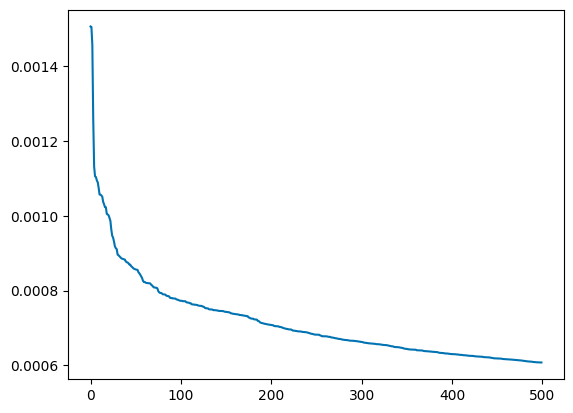

In [22]:
s,i = left_sv_ac[22,10,:,0].cpu().sort(descending=True)
plt.plot(s[:500]);

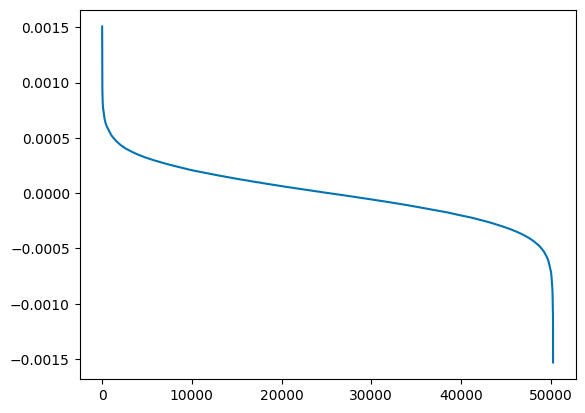

In [23]:
plt.plot(s);

**Note**: These still look pretty uninterpretable! 

### Changing the embedding back to `model.W_U`

In [24]:
U.mT.shape, torch.linalg.pinv(model.W_E).shape, model.W_U.shape

(torch.Size([24, 16, 64, 1024]),
 torch.Size([1024, 50257]),
 torch.Size([1024, 50257]))

In [25]:
left_sv_ac_w_u = (U.mT @ model.W_U).mT

layer = 22

# NOTE the strange size for circuitviz
tmp_ac = left_sv_ac_w_u[None,layer,...].cpu().numpy()
display(HTML(f'<div style="text-align: center;"><h3>Left SV (W_U) - Layer:{layer}</h3></div>'))
cv.topk_tokens.topk_tokens(
    tokens=[all_tokens], 
    activations=tmp_ac,
    first_dimension_name='Attn. Head',
    third_dimension_name='Singular Vectors',
    max_k=20)

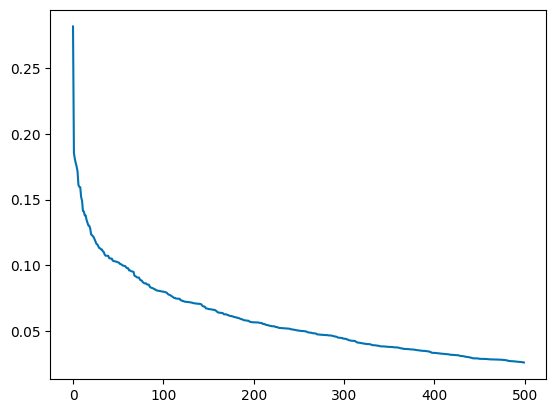

In [26]:
s,i = left_sv_ac_w_u[22,10,:,0].cpu().sort(descending=True)
plt.plot(s[:500]);

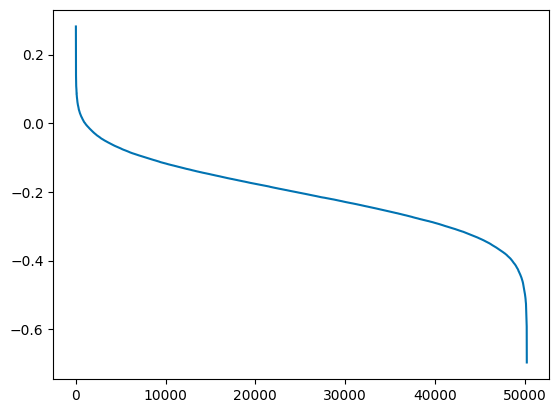

In [27]:
plt.plot(s);

### Observations

- Its clear that $W_U$ provides more meaning to the left singular vectors in GPT2-Medium, as opposed to GPT2-small.
- Unclear as to why - want to understand much more clearly.

---

## Concept Tracing

They take a simple approach of taking an input query $q$ and embedding it as: 

$$\hat{x} = qW_E$$

They then search for the "nearest" singular vectors as:

$$\text{sim}(\hat{x},v_i)$$

Giving them a suprisingly sharp measure. When the input is "a bunch of fire related terms" they get:

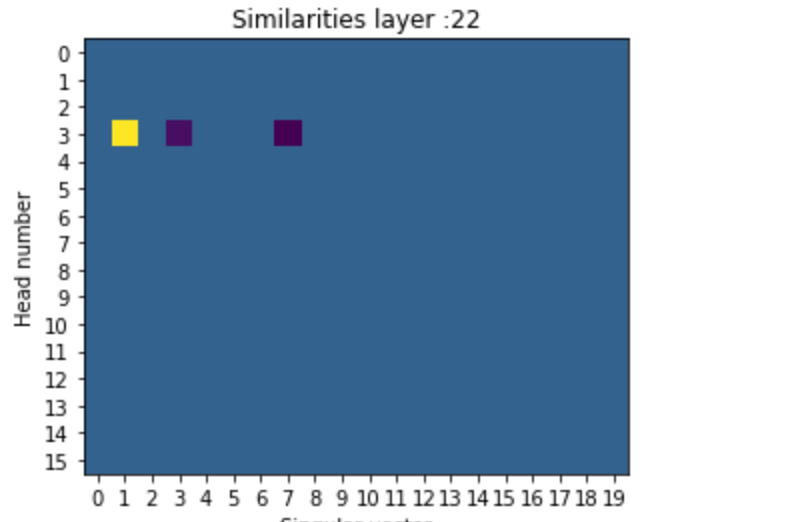

Note: x-axis here is SV, y-axis is head. This is all in layer 22. 

Curious to see how this measure behaves across layers

Highlighting the "fire" SV and the "Ice" SV, its antipodal pair. 

**Note**: these results are on GPT2-Medium

### Looking for Fire

They report a clear antipodal pair of "fire" and "ice" SVs in L22H3SV1:

In [28]:
# NOTE the strange size for circuitviz
layer = 22

tmp_ac = left_sv_ac_w_u[None,layer,...].cpu().numpy()
display(HTML(f'<div style="text-align: center;"><h3>Left SV (W_U) - Layer:{layer}</h3></div>'))
cv.topk_tokens.topk_tokens(
    tokens=[all_tokens], 
    activations=tmp_ac,
    first_dimension_name='Attn. Head',
    third_dimension_name='Singular Vectors',
    max_k=20)

In [29]:
# NOTE the strange size for circuitviz
layer = 22

tmp_ac = right_sv_ac[None,layer,...].cpu().numpy()
display(HTML(f'<div style="text-align: center;"><h3>Right SV - Layer:{layer}</h3></div>'))
cv.topk_tokens.topk_tokens(
    tokens=[all_tokens], 
    activations=tmp_ac,
    first_dimension_name='Attn. Head',
    third_dimension_name='Singular Vectors',
    max_k=20)

**NOTE**: We do not find it where they report... Lets implement this algorithm and search for it:

### Implementation

In [30]:
### SET PARAMETERS
sim_threshold = 0.15
N_singular_vectors = 15

tokens_to_trace = "burn Fire Fire fires Burn Burn burning flames blaze burns burner fire burning Burning Fired flame"
#tokens_to_trace = "flames blaze burns burner fire Fired flame"
# tokens_to_trace = "Snow ice cold chilled Frost frozen Frozen chilling snow colder freezing froze winter freezes freeze"
#tokens_to_trace = "state country politics governor michigan tennessee england government "
#tokens_to_trace = "city urban beijing london paris berlin washington district downtown"
#tokens_to_trace = "burning firefighter blaze"
#tokens_to_trace = "dogs puppy dog Dog Cat cat canine vetinary pet"
# tokens_to_trace = "newspaper news write read record report written twitter journalist investigator investigate reporter"
#tokens_to_trace = "happiness sunshine joy wellbeing health contentment peace enlightenment"
# tokens_to_trace = "republican democrat trump hillary pundit news obama president america"
# tokens_to_trace = "the , a ; and ) \' \""
#tokens_to_trace = "saturday sunday monday tuesday wednesday thursday friday time morning evening winter summer autumn fall spring"
#tokens_to_trace = "researcher investigator reporter writer commentator #earcher professor researcher #Reviewer foe writer instructor" #pund', 'colleague', '#iever', '#being', 'analyst', 'newcomer', 'reporter', 'counselor', '#rower', 'agent', 'politician', '#agonist', 'novelist', 'physicist', 'blogger', 'staffer', 'Dane', 'campaigner', 'teammate', 'psychologist', 'apostle', 'lawmaker']
#tokens_to_trace = "1000 1200 1900 1800 1700 9000 2020 1845 1942 1943 1940 1995"


### move from token space to residual space
# shape: [50257, 768]
# embedding_mat = model.W_E                    # seems the obvious choice
embedding_mat = torch.linalg.pinv(model.W_U)   # but they reported much more success here


### move from residual space to token space
unembedding_mat = model.W_U                      # obvious choice
# unembedding_mat = torch.linalg.pinv(model.W_E) # wonder if they tried this?


### embed the test tokens
token_list = model.tokenizer.encode(tokens_to_trace)
embed_dist = torch.zeros(model.W_U.shape[1]).cuda()
embed_dist[token_list] = 1        # shape: [50257]

embed_proj = embed_dist @ embedding_mat            # project to embedding space
embed_proj = embed_proj / torch.sum(embed_proj)    # normalize


for layer_idx in range(n_layers):
    print_img = False
    # go through heads in layer
    head_sims = []
    for head in range(n_heads):
        # NOTE - Replaced all the above with SVDs taken above:
        # TODO - Will need to fix this to make it easier to swap to different matrices in the future
        U_head, S_head, V_T_head = U[layer_idx,head,:,:], S[layer_idx,head,:], V_T[layer_idx,head,:,:]
    
        # process singular vectors
        sims = []
        for sv_num in range(N_singular_vectors):
            sim = cosine_sim(embed_proj, V_T_head[sv_num,:]).item()
            if -sim_threshold <= sim <= sim_threshold:
                sims.append(0)
            else:
                print_img = True
                print(f'\nSIM FOUND: L{layer_idx}H{head}SV{sv_num} with sim:{sim}')
                sims.append(sim)
                sv_tokens_p = V_T_head[sv_num,:] @ unembedding_mat
                sv_tokens_n = -V_T_head[sv_num,:] @ unembedding_mat
                _, indices_p = sv_tokens_p.topk(k=20)
                _, indices_n = sv_tokens_n.topk(k=20)
                print("Found tokens:")
                print('P:', '|'.join(model.to_str_tokens(indices_p)))
                print('N:', '|'.join(model.to_str_tokens(indices_n)))
        sims = np.array(sims)
        head_sims.append(sims)
    head_sims = np.array(head_sims)
    # plt.imshow(head_sims)
    # plt.xticks(np.arange(0, N_singular_vectors))
    # plt.yticks(np.arange(0, n_heads))
    # plt.title("Similarities layer :" + str(layer_idx))
    # plt.ylabel("Head number")
    # plt.xlabel("Singular vector");
    # plt.colorbar();
    if print_img:
        fig = px.imshow(head_sims, color_continuous_scale='Viridis')
        fig.update_layout(
            width=800, 
            height=600, 
            title=f'Similarities Layer{layer_idx}', 
            xaxis_title='Singular Vectors', 
            yaxis_title='Head Number'
        )
        fig.show()


SIM FOUND: L18H0SV13 with sim:-0.1727474480867386
Found tokens:
P: Alert| glim| encour| Appeal| appealed| flames| Purg| appeals| sparks| appeal| Drawn| attracting| referral| PsyNet| Flames| burns| attract| combust| incent| saved
N:  overw| absentee|rones| overwrite| invading|arth|hea| takeover|cover| ruins| disband|atellite| invade|ravel|occup| shells| covering|inv| replacement|kay



SIM FOUND: L22H3SV1 with sim:-0.47579196095466614
Found tokens:
P:  fire| burn|Fire| FIRE| fires| Fire| Burn|Burn|burning| flames| blaze| burns| burner|fire| burning| Burning| burned| Fired| flame| Fires
N:  frost| Snow| ice| cold| chilled|Snow| Frost| frozen| Frozen| chilling| snow| colder| freezing| Cold| froze| Winter|cold| freezes| freeze|Cold

SIM FOUND: L22H3SV3 with sim:0.2198108285665512
Found tokens:
P:  Spin|anium|Tesla| Ske| spine|Ax| Tyson| skeleton|echo| cage|slice|Mus|Bone| verte| Bone| Zig| spinning| cages| Volt| Rept
N: Rain| floods| Wet| flood| Harvey| Rain| flooding| rain|water|Water| moisture| rainfall| Flood| wet| salty|Gay| water| kissing| homophobic| gay

SIM FOUND: L22H3SV7 with sim:0.22939448058605194
Found tokens:
P: Sex| masturb| masturbation| Sex| sex| Cum| porn| Porn| erotic| Sexual| Sins|sex|Sexual| sexuality| panties| Spit|edes| genitals| obscene| horny
N:  frost| fire| Frost| lighting| flame| Lighting| Fire| flames| Lights| icy| blaze| Glac|Light| lights


SIM FOUND: L23H12SV11 with sim:-0.1595865786075592
Found tokens:
P:  fare|GROUND| fares| Transit| Tsukuyomi|Moving|Travel|Move| MTA| movement| Bus| grounded| Move| Passenger| move| Carrier| strike|bus|hesive| moving
N:  Rifle| rifle| rifles| Gun|Gun| pistols| pools|Pool| pool| padd| gun| pistol| guns| Arms| firearms| Shoot|Race| GUN|igun| reservoir


### Exp1: From ice to Fire!

With the tokens: 

```
tokens_to_trace = "Snow ice cold chilled Frost frozen Frozen chilling snow colder freezing froze winter freezes freeze"
```

**NOTE**: And sim_threshold: `0.25` (much higher than their `0.15`) - I set this empirically after looking at the ones that made sense, and seeing their sims - this seems error prone (not to mention the HUGE bias!)

We find in Layer 22:

```
SIM FOUND: L22H3SV1 with sim:0.2961049973964691
Found tokens:
P:  fire| burn| fires|Fire|burning| Fire| FIRE| flames|Burn| Burn| blaze|fire| burner| burning| burns|fires| flame| Burning|burn| burned
N:  frost| Snow|Snow| ice| chilled| cold| froze| Frost| frozen| freezes| freezing| chilling| freeze| Frozen| Freeze| Winter| snow| colder| Cold|cold

SIM FOUND: L22H3SV7 with sim:-0.2729739248752594
Found tokens:
P:  Frost| frost| icy| freezing| chilled| ice| flame| Torch| cold|Ice| frozen| Glac| colder| freezes| Frozen| Ice| freeze| rink| snowy| furnace
N:  masturbation| masturb|Sex| swall|Fly| sex| Sex| Fly| Mast| Oral| Blow| Flying| porn|cock|Flight|Air| Porn| flies|Flying| Bed
```

![](l22-medium-ice-trace-exp1.png)

### Exp2: From fire to fire

With the tokens:

```
tokens_to_trace = "burn Fire Fire fires Burn Burn burning flames blaze burns burner fire burning Burning Fired flame"
```

And `sim_threshold=0.25` as explained above

We find: 

```
SIM FOUND: L22H3SV1 with sim:-0.4626065492630005
Found tokens:
P:  fire| burn| fires|Fire|burning| Fire| FIRE| flames|Burn| Burn| blaze|fire| burner| burning| burns|fires| flame| Burning|burn| burned
N:  frost| Snow|Snow| ice| chilled| cold| froze| Frost| frozen| freezes| freezing| chilling| freeze| Frozen| Freeze| Winter| snow| colder| Cold|cold
```

![](l22-mediun-fire-trace-exp2.png)

#### Observations

- the above analysis also finds a bunch of nonsense in L23
- L23H15SV2N - Finally seems to be the "most common tokens" SV! Found it by chance
- L23H15SV2P - seems to be the most rare tokens

Happy enough now to keep going with model editting.

### Searching through left as well

In [31]:
### SET PARAMETERS
sim_threshold = 0.2
N_singular_vectors = 15

tokens_to_trace = "burn Fire Fire fires Burn Burn burning flames blaze burns burner fire burning Burning Fired flame"
# tokens_to_trace = "flames blaze burns burner fire Fired flame"
# tokens_to_trace = "Snow ice cold chilled Frost frozen Frozen chilling snow colder freezing froze winter freezes freeze"
#tokens_to_trace = "state country politics governor michigan tennessee england government "
#tokens_to_trace = "city urban beijing london paris berlin washington district downtown"
#tokens_to_trace = "burning firefighter blaze"
#tokens_to_trace = "dogs puppy dog Dog Cat cat canine vetinary pet"
# tokens_to_trace = "newspaper news write read record report written twitter journalist investigator investigate reporter"
# tokens_to_trace = "happiness sunshine joy wellbeing health contentment peace enlightenment"
# tokens_to_trace = "republican democrat trump hillary pundit news obama president america"
# tokens_to_trace = "the , a ; and ) \' \""
#tokens_to_trace = "saturday sunday monday tuesday wednesday thursday friday time morning evening winter summer autumn fall spring"
#tokens_to_trace = "researcher investigator reporter writer commentator #earcher professor researcher #Reviewer foe writer instructor" #pund', 'colleague', '#iever', '#being', 'analyst', 'newcomer', 'reporter', 'counselor', '#rower', 'agent', 'politician', '#agonist', 'novelist', 'physicist', 'blogger', 'staffer', 'Dane', 'campaigner', 'teammate', 'psychologist', 'apostle', 'lawmaker']
# tokens_to_trace = "1000 1200 1900 1800 1700 9000 2020 1845 1942 1943 1940 1995"


### move from token space to residual space
# shape: [50257, 768]
# embedding_mat = model.W_E                    # seems the obvious choice
embedding_mat = torch.linalg.pinv(model.W_U)   # but they reported much more success here


### move from residual space to token space
unembedding_mat = model.W_U                      # obvious choice
# unembedding_mat = torch.linalg.pinv(model.W_E) # wonder if they tried this?


### embed the test tokens
token_list = model.tokenizer.encode(tokens_to_trace)
embed_dist = torch.zeros(model.W_U.shape[1]).cuda()
embed_dist[token_list] = 1        # shape: [50257]

embed_proj = embed_dist @ embedding_mat            # project to embedding space
embed_proj = embed_proj / torch.sum(embed_proj)    # normalize


for layer_idx in range(n_layers):
    print_img = False
    head_sims_l = []
    head_sims_r = []

    # go through heads in layer
    for head in range(n_heads):
        # NOTE - Replaced all the above with SVDs taken above:
        # TODO - Will need to fix this to make it easier to swap to different matrices in the future
        U_head, S_head, V_T_head = U[layer_idx,head,:,:], S[layer_idx,head,:], V_T[layer_idx,head,:,:]
    
        # process singular vectors
        sims_l = []
        sims_r = []
        for sv_num in range(N_singular_vectors):
            sim_l = cosine_sim(embed_proj, U_head[:,sv_num]).item()
            sim_r = cosine_sim(embed_proj, V_T_head[sv_num,:]).item()
            if (-sim_threshold <= sim_l <= sim_threshold) and (-sim_threshold <= sim_r <= sim_threshold):
                sims_l.append(0)
                sims_r.append(0)
            else:
                print_img = True
                print(f'\nSIM FOUND: L{layer_idx}H{head}SV{sv_num} with sim_l/r:{sim_l,sim_r}')
                sims_l.append(sim_l)
                sims_r.append(sim_r)

                # right
                sv_tokens_p = V_T_head[sv_num,:] @ unembedding_mat
                sv_tokens_n = -V_T_head[sv_num,:] @ unembedding_mat
                _, indices_p = sv_tokens_p.topk(k=20)
                _, indices_n = sv_tokens_n.topk(k=20)
                print("Found RIGHT tokens:")
                print('-->P:', '|'.join(model.to_str_tokens(indices_p)))
                print('-->N:', '|'.join(model.to_str_tokens(indices_n)))
                print()

                # left
                sv_tokens_p = U_head[:,sv_num] @ unembedding_mat
                sv_tokens_n = -U_head[:,sv_num] @ unembedding_mat
                _, indices_p = sv_tokens_p.topk(k=20)
                _, indices_n = sv_tokens_n.topk(k=20)
                print("Found LEFT tokens:")
                print('-->P:', '|'.join(model.to_str_tokens(indices_p)))
                print('-->N:', '|'.join(model.to_str_tokens(indices_n)))
                print()
                
        sims_l = np.array(sims_l)
        sims_r = np.array(sims_r)
        
        head_sims_l.append(sims_l)
        head_sims_r.append(sims_r)
        
    head_sims_l = np.array(head_sims_l)
    head_sims_r = np.array(head_sims_r)
    
    if print_img:
        fig = px.imshow(head_sims_l, color_continuous_scale='Viridis')
        fig.update_layout(
            width=800, 
            height=600, 
            title=f'LEFT: Similarities Layer{layer_idx}', 
            xaxis_title='Singular Vectors', 
            yaxis_title='Head Number'
        )
        fig.show()

        fig = px.imshow(head_sims_r, color_continuous_scale='Viridis')
        fig.update_layout(
            width=800, 
            height=600, 
            title=f'RIGHT: Similarities Layer{layer_idx}', 
            xaxis_title='Singular Vectors', 
            yaxis_title='Head Number'
        )
        fig.show()


SIM FOUND: L22H3SV1 with sim_l/r:(-0.2253369837999344, -0.47579196095466614)
Found RIGHT tokens:
-->P:  fire| burn|Fire| FIRE| fires| Fire| Burn|Burn|burning| flames| blaze| burns| burner|fire| burning| Burning| burned| Fired| flame| Fires
-->N:  frost| Snow| ice| cold| chilled|Snow| Frost| frozen| Frozen| chilling| snow| colder| freezing| Cold| froze| Winter|cold| freezes| freeze|Cold

Found LEFT tokens:
-->P:  fire| FIRE| fires| Fire| blaze| fireworks|Fire| flames|fires| burner| fireball| flare| Burn| blazing| burns| wildfire| Fired| sear| burn|escape
-->N:  Frozen| winters|anch|farm|ynski| chilled|liga|ilver|ror|hem|stract|anski|lass|heny| frost|worthiness|cery| icy|crime|dk


SIM FOUND: L22H3SV3 with sim_l/r:(0.10355658084154129, 0.2198108285665512)
Found RIGHT tokens:
-->P:  Spin|anium|Tesla| Ske| spine|Ax| Tyson| skeleton|echo| cage|slice|Mus|Bone| verte| Bone| Zig| spinning| cages| Volt| Rept
-->N: Rain| floods| Wet| flood| Harvey| Rain| flooding| rain|water|Water| moisture| ra

---

# Model Editting

As discussed, ~~I will start with a simple 2-layer attention-only model where induction is well understood and see if rank-1 editting can break it~~

**Note**: Could not find any meaningul "concept" vectors in a 2-layer attention only model using SVD/concept tracing as described above, in either positive/negative directions. 

Going to continue here with `gpt2-medium`

## Dyadic Notation

Recall the matrix definition of the SVD $M = U S V$. Using the orthogonality of the singular vectors, we can break apart this matrix expression into a sum of low-rank updates,

$$M = \sum_{i=1}^{\text{rank}(M)} S_i * U_i V_i^T$$

Where $S_i$ is the ith singular vector, and $U_i$ and $V_i$ are the i'th columns of the left and right singular vector matrices. 

In [32]:
rank = d_head # S.shape[-1] as well
M = torch.zeros_like(model.OV.AB)
for i in range(rank):
    M += S[:,:,i,None,None] * (U[:,:,:,i,None] @ V_T[:,:,None,i,:])

In [33]:
torch.dist(M, model.OV.AB)

tensor(0.0395, device='cuda:0')

In [34]:
try:
    torch.testing.assert_close(M,model.OV.AB)
except Exception as e:
    print(e)

Tensor-likes are not close!

Mismatched elements: 335501 / 402653184 (0.1%)
Greatest absolute difference: 0.00138092041015625 at index (23, 6, 9, 268) (up to 1e-05 allowed)
Greatest relative difference: 0.3020377929240868 at index (22, 2, 868, 590) (up to 1.3e-06 allowed)


## Rank-1 Update:

Given this sum, it is straightforward to see that we can a similar matrix but **without** this singular vector with the rank one update

$$\hat{M} = M - S_i * U_i V_i^T$$

In [35]:
ORIG_OV = model.OV.AB.data.clone()
ORIG_W_O = model.W_O.data.clone()
ORIG_W_V = model.W_V.data.clone()
ORIG_OV.shape, ORIG_W_O.shape, ORIG_W_V.shape

(torch.Size([24, 16, 1024, 1024]),
 torch.Size([24, 16, 64, 1024]),
 torch.Size([24, 16, 1024, 64]))

### Implementation

In [36]:
def single_rank_update(layer,head,sv_num):
    # grab layer+head OV circuit
    A = model.OV[layer,head]

    # grab layer+head SVD (pre-computed)
    U_lh, S_lh, V_T_lh = U[layer,head,:,:], S[layer,head,:], V_T[layer,head,:,:]

    # grab i-th SV term
    sing_val = S_lh[sv_num]
    right_vec = V_T_lh[sv_num,:].reshape(-1,1)
    left_vec = U_lh[:,sv_num].reshape(-1,1)
    low_rank_update = sing_val * (left_vec @ right_vec.T)

    # remove it from matrix
    B = A.AB - low_rank_update
    
    return B, low_rank_update

dist = []
for i in range(64):
    new_OV,_ = single_rank_update(22,10,i)
    dist.append(torch.dist(new_OV, model.OV[22,10].AB).cpu().numpy())

fig = go.Figure(go.Scatter(x=list(range(len(dist))), y=dist, mode='lines'))
fig.update_layout(title='Dist after Rank-1 Edit',
                  xaxis_title='Singular Vector',
                  yaxis_title='Dist',
                  width=800,
                  height=600
                 )
fig.show()

In [37]:
layer = 22
head = 10
sv_num = 0

def edit_and_remake_mat_components(layer,head,sv_num,verbose=False):
    with torch.no_grad():
        new_OV, _ = single_rank_update(layer,head,sv_num)
        # SVD and re-put together the new updatd matrix
        U_new, S_new, V_new = torch.linalg.svd(new_OV)
        Sdiag = torch.diag_embed(S_new)
        S64 = Sdiag[0:d_head, 0:d_head]
        S64sqrt = torch.sqrt(S64)
        M1 = U_new[:, 0:d_head] @ S64sqrt
        M2 =  S64sqrt @ V_new[0:d_head,:] 
        OV_redone = M1 @ M2
        if verbose:
            print("dist: ", torch.dist(OV_redone, new_OV))
        new_V = M1
        new_O = M2
        return new_V, new_O

_,_= edit_and_remake_mat_components(layer, head, sv_num, verbose=True)

dist:  tensor(0.0086, device='cuda:0')


Lets apply the edit:

In [38]:
def set_new_OV(layer,head,new_W_V,new_W_O,verbose=False):
    edit_dict = dict([(f'blocks.{layer}.attn.W_V',new_W_V),
                  (f'blocks.{layer}.attn.W_O',new_W_O)
                 ])
    
    for p_name, param in model.named_parameters():
        if p_name in edit_dict:
            if verbose: print(f'editing {p_name} with shape {param.shape}')
            param.data[head,:,:] = edit_dict[p_name]
            if verbose: print(f'now has shape {param.shape}')

def reset_OV(layer,head):
    set_new_OV(layer,head,
               ORIG_W_V[layer,head,:,:],
               ORIG_W_O[layer,head,:,:])

### Testing Implementation

Lets test 

**NOTE**: Model properties like `model.OV`,`model.W_V` etc. are **cached**!

Need to check like: `model.blocks[22].attn.W_V`

In [39]:
reset_OV(22,10)
torch.testing.assert_close(ORIG_W_V[22,10],model.blocks[22].attn.W_V[head])
torch.testing.assert_close(ORIG_W_O[22,10],model.blocks[22].attn.W_O[head])

In [40]:
new_W_V, new_W_O = edit_and_remake_mat_components(layer, head, sv_num)
torch.testing.assert_close(ORIG_W_V[22,10],model.blocks[22].attn.W_V[head])
torch.testing.assert_close(ORIG_W_O[22,10],model.blocks[22].attn.W_O[head])

In [41]:
set_new_OV(22,10,new_W_V,new_W_O,verbose=True)

editing blocks.22.attn.W_V with shape torch.Size([16, 1024, 64])
now has shape torch.Size([16, 1024, 64])
editing blocks.22.attn.W_O with shape torch.Size([16, 64, 1024])
now has shape torch.Size([16, 64, 1024])


In [42]:
try:
    torch.testing.assert_close(ORIG_W_V[22,10],model.blocks[22].attn.W_V[head])
    torch.testing.assert_close(ORIG_W_O[22,10],model.blocks[22].attn.W_O[head])
except Exception as e:
    print("THIS SHOULD FAIL!")
    print(e)

THIS SHOULD FAIL!
Tensor-likes are not close!

Mismatched elements: 65531 / 65536 (100.0%)
Greatest absolute difference: 0.7521781921386719 at index (598, 23) (up to 1e-05 allowed)
Greatest relative difference: 165174.59841639994 at index (148, 63) (up to 1.3e-06 allowed)


In [43]:
# this should not
torch.testing.assert_close(new_W_V,model.blocks[22].attn.W_V[head])
torch.testing.assert_close(new_W_O,model.blocks[22].attn.W_O[head])

Lets reset it back:

In [44]:
reset_OV(22,10)
torch.testing.assert_close(ORIG_W_V[22,10],model.blocks[22].attn.W_V[head])
torch.testing.assert_close(ORIG_W_O[22,10],model.blocks[22].attn.W_O[head])

This should fail now:

In [45]:
try:
    torch.testing.assert_close(new_W_V,model.blocks[22].attn.W_V[head])
    torch.testing.assert_close(new_W_O,model.blocks[22].attn.W_O[head])
except Exception as e:
    print("THIS SHOULD FAIL!")
    print(e)

THIS SHOULD FAIL!
Tensor-likes are not close!

Mismatched elements: 65531 / 65536 (100.0%)
Greatest absolute difference: 0.7521781921386719 at index (598, 23) (up to 1e-05 allowed)
Greatest relative difference: 9258.428856537248 at index (608, 0) (up to 1.3e-06 allowed)


### Comparison Implementation

Lets implement a simple function to test the log prob change of deleting a SV (rank-1 change)

In [46]:
def removing_singular_vector_comparison(text, layer_idx, head_idx, N_singular_vectors = 10, verbose=False):
    logits = model(text, return_type='logits')
    # decode output logits
    next_tokens_logits = logits[:, -1].clone()
    # get probs before applying filters
    original_next_tokens_probs = F.softmax(next_tokens_logits, dim=-1)
    correct_idx = torch.argmax(original_next_tokens_probs)
    print("Predicted token: ", model.tokenizer.decode(correct_idx))

    correct_logprob = original_next_tokens_probs[0,correct_idx].log()
    
    if verbose:
        print(f'{logits.shape=}')
        print(f'{next_tokens_logits.shape=}')
        print(f'{original_next_tokens_probs.shape=}')
        print(f'{correct_idx.shape=}')
        print(f'{original_next_tokens_probs.shape=}')
        print(f'{original_next_tokens_probs[0,correct_idx].log()=}')
        print(f'{model.tokenizer.decode(correct_idx)=}')
        print(f'{correct_logprob.shape=}')
    
    logprobs = []
    # get OV circuit
    W_V_tmp, W_O_tmp = ORIG_W_V[layer_idx,head_idx,:,:], ORIG_W_O[layer_idx,head_idx,:,:]
    OV = W_V_tmp @ W_O_tmp
    
    for i in range(N_singular_vectors):
        # reset
        reset_OV(layer_idx,head_idx)

        # get new OV circuit for this edit
        new_W_V, new_W_O = edit_and_remake_mat_components(layer_idx,head_idx,i)

        # set new OV circuit
        set_new_OV(layer_idx,head_idx,new_W_V,new_W_O)
                
        # run modified model
        logits = model(text)
        # decode output logits
        next_tokens_logits = logits[:, -1].clone()
        # get probs before applying filters
        original_next_tokens_probs = F.softmax(next_tokens_logits, dim=-1)
        correct_idx = torch.argmax(original_next_tokens_probs)
        correct_logprob = original_next_tokens_probs[0,correct_idx].log().item()
        if verbose:
            print("correct logprob: " + str(i) + "  " + str(correct_logprob))
        logprobs.append(correct_logprob)
    
    plt.plot(logprobs)
    plt.xlabel("Singular vector")
    plt.ylabel("Log probability")
    plt.title("Logprob when ablating singular vector")
    plt.show()

## Exp: Remove Fire:

Ok now we're ready to remove the fire token:

In [47]:
### SET PARAMETERS
sim_threshold = 0.2
N_singular_vectors = 15

tokens_to_trace = "burn Fire Fire fires Burn Burn burning flames blaze burns burner fire burning Burning Fired flame"

### move from token space to residual space
# shape: [50257, 768]
# embedding_mat = model.W_E                    # seems the obvious choice
embedding_mat = torch.linalg.pinv(model.W_U)   # but they reported much more success here


### move from residual space to token space
unembedding_mat = model.W_U                      # obvious choice
# unembedding_mat = torch.linalg.pinv(model.W_E) # wonder if they tried this?


### embed the test tokens
token_list = model.tokenizer.encode(tokens_to_trace)
embed_dist = torch.zeros(model.W_U.shape[1]).cuda()
embed_dist[token_list] = 1        # shape: [50257]

embed_proj = embed_dist @ embedding_mat            # project to embedding space
embed_proj = embed_proj / torch.sum(embed_proj)    # normalize


for layer_idx in range(n_layers):
    print_img = False
    head_sims_l = []
    head_sims_r = []

    # go through heads in layer
    for head in range(n_heads):
        # NOTE - Replaced all the above with SVDs taken above:
        # TODO - Will need to fix this to make it easier to swap to different matrices in the future
        U_head, S_head, V_T_head = U[layer_idx,head,:,:], S[layer_idx,head,:], V_T[layer_idx,head,:,:]
    
        # process singular vectors
        sims_l = []
        sims_r = []
        for sv_num in range(N_singular_vectors):
            sim_l = cosine_sim(embed_proj, U_head[:,sv_num]).item()
            sim_r = cosine_sim(embed_proj, V_T_head[sv_num,:]).item()
            if (-sim_threshold <= sim_l <= sim_threshold) and (-sim_threshold <= sim_r <= sim_threshold):
                sims_l.append(0)
                sims_r.append(0)
            else:
                print_img = True
                print(f'\nSIM FOUND: L{layer_idx}H{head}SV{sv_num} with sim_l/r:{sim_l,sim_r}')
                sims_l.append(sim_l)
                sims_r.append(sim_r)

                # left
                sv_tokens_p = U_head[:,sv_num] @ unembedding_mat
                sv_tokens_n = -U_head[:,sv_num] @ unembedding_mat
                _, indices_p = sv_tokens_p.topk(k=20)
                _, indices_n = sv_tokens_n.topk(k=20)
                print("Found LEFT tokens:")
                print('-->P:', '|'.join(model.to_str_tokens(indices_p)))
                print('-->N:', '|'.join(model.to_str_tokens(indices_n)))
                print()

                
                # right
                sv_tokens_p = V_T_head[sv_num,:] @ unembedding_mat
                sv_tokens_n = -V_T_head[sv_num,:] @ unembedding_mat
                _, indices_p = sv_tokens_p.topk(k=20)
                _, indices_n = sv_tokens_n.topk(k=20)
                print("Found RIGHT tokens:")
                print('-->P:', '|'.join(model.to_str_tokens(indices_p)))
                print('-->N:', '|'.join(model.to_str_tokens(indices_n)))
                print()

                
                
        sims_l = np.array(sims_l)
        sims_r = np.array(sims_r)
        
        head_sims_l.append(sims_l)
        head_sims_r.append(sims_r)
        
    head_sims_l = np.array(head_sims_l)
    head_sims_r = np.array(head_sims_r)
    
    if print_img:
        fig = px.imshow(head_sims_l, color_continuous_scale='Viridis')
        fig.update_layout(
            width=800, 
            height=600, 
            title=f'LEFT: Similarities Layer{layer_idx}', 
            xaxis_title='Singular Vectors', 
            yaxis_title='Head Number'
        )
        fig.show()

        fig = px.imshow(head_sims_r, color_continuous_scale='Viridis')
        fig.update_layout(
            width=800, 
            height=600, 
            title=f'RIGHT: Similarities Layer{layer_idx}', 
            xaxis_title='Singular Vectors', 
            yaxis_title='Head Number'
        )
        fig.show()


SIM FOUND: L22H3SV1 with sim_l/r:(-0.2253369837999344, -0.47579196095466614)
Found LEFT tokens:
-->P:  fire| FIRE| fires| Fire| blaze| fireworks|Fire| flames|fires| burner| fireball| flare| Burn| blazing| burns| wildfire| Fired| sear| burn|escape
-->N:  Frozen| winters|anch|farm|ynski| chilled|liga|ilver|ror|hem|stract|anski|lass|heny| frost|worthiness|cery| icy|crime|dk

Found RIGHT tokens:
-->P:  fire| burn|Fire| FIRE| fires| Fire| Burn|Burn|burning| flames| blaze| burns| burner|fire| burning| Burning| burned| Fired| flame| Fires
-->N:  frost| Snow| ice| cold| chilled|Snow| Frost| frozen| Frozen| chilling| snow| colder| freezing| Cold| froze| Winter|cold| freezes| freeze|Cold


SIM FOUND: L22H3SV3 with sim_l/r:(0.10355658084154129, 0.2198108285665512)
Found LEFT tokens:
-->P:  ratt|law| conditioning|ill|alert| scratching| shielding|itar| ↑| Jump|illary|abre|leton| ticking|hung|ADVERTISEMENT| Spiral|rising| scratched|flight
-->N: iott| watered|epad|teenth|yy| wetlands|bnb|iere|unal|t

As above we observe:
- L22H3
    - SV1
        - P: fire/burn
        - N: frost/cold
    - SV3
        - P: nothing?
        - N: Rain| floods| Wet| **GAY**   -- **Note**: sexuality comes into play?
    - SV7
        - P: Sex/masturbation
        - N: frost| fire| Frost| lighting| flame -- **Note**: Mix of ice/fire?

Predicted token:   fire


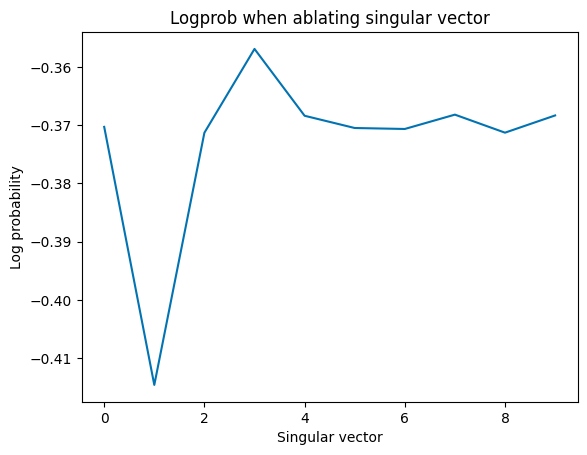

In [48]:
text = "Be careful leaving the iron on because it might catch"
layer = 22
head = 3
removing_singular_vector_comparison(text, layer_idx=layer, head_idx = head)

We observe that when removing SV1:
- the prob of fire drops substantially
- the prob of fire increases when removing SV3 which is rain/wet

Predicted token:   cold


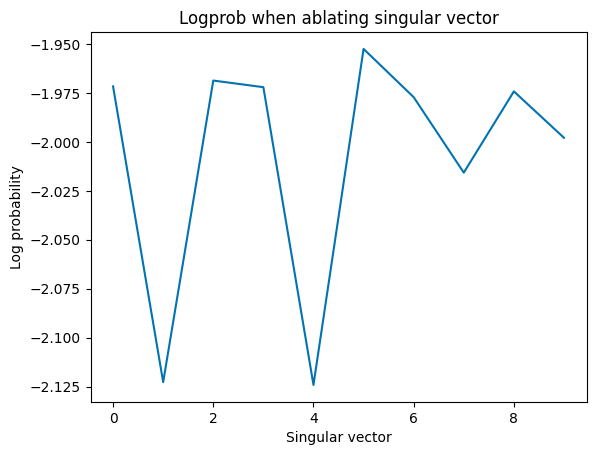

In [49]:
text = "Be careful leaving the icy snow on your hand it might get"
layer = 22
head = 3
removing_singular_vector_comparison(text, layer_idx=layer, head_idx = head)

Removing SV1 makes sense, as its negative side is also cold. What about 4?

In [50]:
_,i=right_sv_ac[layer,head,:,4].topk(k=10)
_,j=(-right_sv_ac[layer,head,:,4]).topk(k=10)
print('P:','|'.join(model.to_str_tokens(i)))
print('N:','|'.join(model.to_str_tokens(j)))

P:  Wave|Wave| Moonlight| wave|wave|Brew| Celt| hairc|Storm| cleans
N:  Ice| ice|Ice| frozen| freeze|Meat| Smoke| freezes| freezer| Cold


Aha! Another cold! Lets verify our sim measure captures it:

In [51]:
### SET PARAMETERS
sim_threshold = 0.25
N_singular_vectors = 15

tokens_to_trace = "Snow ice cold chilled Frost frozen Frozen chilling snow colder freezing froze winter freezes freeze"

### move from token space to residual space
# shape: [50257, 768]
# embedding_mat = model.W_E                    # seems the obvious choice
embedding_mat = torch.linalg.pinv(model.W_U)   # but they reported much more success here


### move from residual space to token space
unembedding_mat = model.W_U                      # obvious choice
# unembedding_mat = torch.linalg.pinv(model.W_E) # wonder if they tried this?


### embed the test tokens
token_list = model.tokenizer.encode(tokens_to_trace)
embed_dist = torch.zeros(model.W_U.shape[1]).cuda()
embed_dist[token_list] = 1        # shape: [50257]

embed_proj = embed_dist @ embedding_mat            # project to embedding space
embed_proj = embed_proj / torch.sum(embed_proj)    # normalize


for layer_idx in range(n_layers):
    print_img = False
    head_sims_l = []
    head_sims_r = []

    # go through heads in layer
    for head in range(n_heads):
        # NOTE - Replaced all the above with SVDs taken above:
        # TODO - Will need to fix this to make it easier to swap to different matrices in the future
        U_head, S_head, V_T_head = U[layer_idx,head,:,:], S[layer_idx,head,:], V_T[layer_idx,head,:,:]
    
        # process singular vectors
        sims_l = []
        sims_r = []
        for sv_num in range(N_singular_vectors):
            sim_l = cosine_sim(embed_proj, U_head[:,sv_num]).item()
            sim_r = cosine_sim(embed_proj, V_T_head[sv_num,:]).item()
            if (-sim_threshold <= sim_l <= sim_threshold) and (-sim_threshold <= sim_r <= sim_threshold):
                sims_l.append(0)
                sims_r.append(0)
            else:
                print_img = True
                print(f'\nSIM FOUND: L{layer_idx}H{head}SV{sv_num} with sim_l/r:{sim_l,sim_r}')
                sims_l.append(sim_l)
                sims_r.append(sim_r)

                # left
                sv_tokens_p = U_head[:,sv_num] @ unembedding_mat
                sv_tokens_n = -U_head[:,sv_num] @ unembedding_mat
                _, indices_p = sv_tokens_p.topk(k=20)
                _, indices_n = sv_tokens_n.topk(k=20)
                print("Found LEFT tokens:")
                print('-->P:', '|'.join(model.to_str_tokens(indices_p)))
                print('-->N:', '|'.join(model.to_str_tokens(indices_n)))
                print()

                
                # right
                sv_tokens_p = V_T_head[sv_num,:] @ unembedding_mat
                sv_tokens_n = -V_T_head[sv_num,:] @ unembedding_mat
                _, indices_p = sv_tokens_p.topk(k=20)
                _, indices_n = sv_tokens_n.topk(k=20)
                print("Found RIGHT tokens:")
                print('-->P:', '|'.join(model.to_str_tokens(indices_p)))
                print('-->N:', '|'.join(model.to_str_tokens(indices_n)))
                print()

                
                
        sims_l = np.array(sims_l)
        sims_r = np.array(sims_r)
        
        head_sims_l.append(sims_l)
        head_sims_r.append(sims_r)
        
    head_sims_l = np.array(head_sims_l)
    head_sims_r = np.array(head_sims_r)
    
    if print_img:
        fig = px.imshow(head_sims_l, color_continuous_scale='Viridis')
        fig.update_layout(
            width=800, 
            height=600, 
            title=f'LEFT: Similarities Layer{layer_idx}', 
            xaxis_title='Singular Vectors', 
            yaxis_title='Head Number'
        )
        fig.show()

        fig = px.imshow(head_sims_r, color_continuous_scale='Viridis')
        fig.update_layout(
            width=800, 
            height=600, 
            title=f'RIGHT: Similarities Layer{layer_idx}', 
            xaxis_title='Singular Vectors', 
            yaxis_title='Head Number'
        )
        fig.show()


SIM FOUND: L22H3SV1 with sim_l/r:(0.16899694502353668, 0.332881897687912)
Found LEFT tokens:
-->P:  fire| FIRE| fires| Fire| blaze| fireworks|Fire| flames|fires| burner| fireball| flare| Burn| blazing| burns| wildfire| Fired| sear| burn|escape
-->N:  Frozen| winters|anch|farm|ynski| chilled|liga|ilver|ror|hem|stract|anski|lass|heny| frost|worthiness|cery| icy|crime|dk

Found RIGHT tokens:
-->P:  fire| burn|Fire| FIRE| fires| Fire| Burn|Burn|burning| flames| blaze| burns| burner|fire| burning| Burning| burned| Fired| flame| Fires
-->N:  frost| Snow| ice| cold| chilled|Snow| Frost| frozen| Frozen| chilling| snow| colder| freezing| Cold| froze| Winter|cold| freezes| freeze|Cold


SIM FOUND: L22H3SV4 with sim_l/r:(0.04516670107841492, 0.2852967083454132)
Found LEFT tokens:
-->P:  spect|cloth|Cle|addy|beat| washing|mson|kb|yard|Instance|vill|omon| umb| Trash|ided| Fitzpatrick| cleansing|UNCH|ikini|cle
-->N: usp|flake|enza| hiber|pps| Pwr|ocene|hene| insulated| Gord| Traps| ven|ctic| SV| me

Indeed we do find it there! 

## Ideas

A followup idea I'd like to try is to try something like: 

$$\begin{align}
\tilde{M} &= \sum^{rank}_i (S_i + \epsilon_iS_i) * U_iV_i^T \\
          &= M + \epsilon_iS_i U_i V_i^T
\end{align}
$$

This formulation is a bit strange. I would prefer to think about us **removing** something from $M$, but this way, the range of $\epsilon$ makes more sense. That is, 

- $[-1,\ldots,0]$: [removing $i$, ...,dampening $i$, ..., leave it alone]
- $[0,\ldots,1,\ldots)$: [leaving it alone, ...., amplifying it?]

Can we can meaninfully turn down/up certain concepts? Instead of just removing?
- "Dampening" may or may not be useful...
    - need to think more about this?
- What about this "amplification"?
    - unclear... 


**Another idea**: To deal with "distributed representations", we could perhaps use concept tracing to find multiple SVs that are similar to a search queary, and dampen then in proportion to their similarity. This will of course have downstream effects...



### Implementation

Lets try it:

In [52]:
def single_rank_update_generic(layer,head,sv_num,eps=0):
    # grab layer+head OV circuit
    A = model.OV[layer,head]

    # grab layer+head SVD (pre-computed)
    U_lh, S_lh, V_T_lh = U[layer,head,:,:], S[layer,head,:], V_T[layer,head,:,:]

    # grab i-th SV term
    sing_val = S_lh[sv_num]
    right_vec = V_T_lh[sv_num,:].reshape(-1,1)
    left_vec = U_lh[:,sv_num].reshape(-1,1)
    low_rank_update = sing_val*(1 + eps) * (left_vec @ right_vec.T)

    # remove it from matrix
    B = A.AB - low_rank_update
    
    return B, low_rank_update

In [53]:
def edit_and_remake_mat_components_generic(layer,head,sv_num,verbose=False,eps=0):
    with torch.no_grad():
        new_OV, _ = single_rank_update_generic(layer,head,sv_num,eps)
        # SVD and re-put together the new updatd matrix
        U_new, S_new, V_new = torch.linalg.svd(new_OV)
        Sdiag = torch.diag_embed(S_new)
        S64 = Sdiag[0:d_head, 0:d_head]
        S64sqrt = torch.sqrt(S64)
        M1 = U_new[:, 0:d_head] @ S64sqrt
        M2 =  S64sqrt @ V_new[0:d_head,:] 
        OV_redone = M1 @ M2
        if verbose:
            print("dist: ", torch.dist(OV_redone, new_OV))
        new_V = M1
        new_O = M2
        return new_V, new_O

def removing_singular_vector_comparison_generic(text, layer_idx, head_idx, N_singular_vectors = 10, verbose=False, eps=0):
    logits = model(text, return_type='logits')
    # decode output logits
    next_tokens_logits = logits[:, -1].clone()
    # get probs before applying filters
    original_next_tokens_probs = F.softmax(next_tokens_logits, dim=-1)
    correct_idx = torch.argmax(original_next_tokens_probs)
    print("Predicted token: ", model.tokenizer.decode(correct_idx))

    correct_logprob = original_next_tokens_probs[0,correct_idx].log()
    
    if verbose:
        print(f'{logits.shape=}')
        print(f'{next_tokens_logits.shape=}')
        print(f'{original_next_tokens_probs.shape=}')
        print(f'{correct_idx.shape=}')
        print(f'{original_next_tokens_probs.shape=}')
        print(f'{original_next_tokens_probs[0,correct_idx].log()=}')
        print(f'{model.tokenizer.decode(correct_idx)=}')
        print(f'{correct_logprob.shape=}')
    
    logprobs = []
    # get OV circuit
    W_V_tmp, W_O_tmp = ORIG_W_V[layer_idx,head_idx,:,:], ORIG_W_O[layer_idx,head_idx,:,:]
    OV = W_V_tmp @ W_O_tmp
    
    for i in range(N_singular_vectors):
        # reset
        reset_OV(layer_idx,head_idx)

        
        # get new OV circuit for this edit
        new_W_V, new_W_O = edit_and_remake_mat_components_generic(layer_idx,head_idx,i,eps=eps)

        # set new OV circuit
        set_new_OV(layer_idx,head_idx,new_W_V,new_W_O)
                
        # run modified model
        logits = model(text)
        # decode output logits
        next_tokens_logits = logits[:, -1].clone()
        # get probs before applying filters
        original_next_tokens_probs = F.softmax(next_tokens_logits, dim=-1)
        correct_idx = torch.argmax(original_next_tokens_probs)
        correct_logprob = original_next_tokens_probs[0,correct_idx].log().item()
        if verbose:
            print("correct logprob: " + str(i) + "  " + str(correct_logprob))
        logprobs.append(correct_logprob)
    
    plt.plot(logprobs)
    plt.xlabel("Singular vector")
    plt.ylabel("Log probability")
    plt.title("Logprob when ablating singular vector")
    plt.show()

Predicted token:   cold


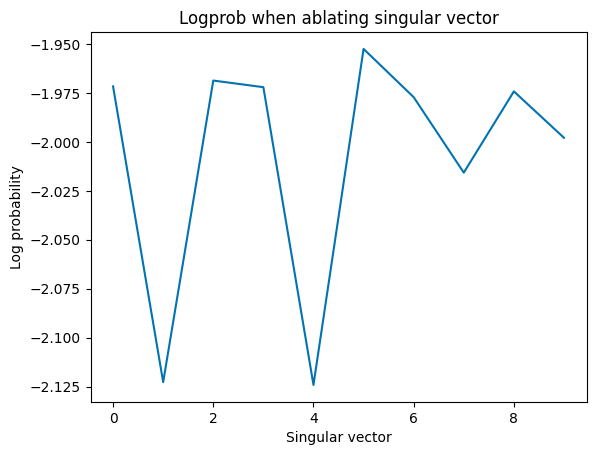

In [54]:
text = "Be careful leaving the icy snow on your hand it might get"
layer = 22
head = 3
eps = 0
removing_singular_vector_comparison_generic(text, layer_idx=layer, head_idx = head,eps=eps)

---

# NOTEBOOK END

Ran out of time! 